# Context

Paper published: https://doi.org/10.1016/j.rse.2017.09.039

- **What**? airborne SAR data research campaign for agriculture between 2013 and 2015
- **Motivation**: show changes in backscatter properties during crop growth + bio- and geophysical properties.
- **Acquisition**: between 2013 and 2015 at regular intervals over heterogenously structured agricultural area of Wafferfing near Deggendorf, Germany
    - For 2014 flights: almost weekly acquisition to cover entire growth period
    - provide polarimetric, interferometer and tomographic data in X, C and L bands

- Report 2011-2017
    - File structure on server
        
        ```markdown
        Guesstimates of acronyms.
        Temporal/
        └── F-SAR TimeSeries (Backup1)/
        ├── C/                      # Possibly a specific sensor or configuration-related data.
        ├── FL00/                   # Campaign or site-specific designation.
        ├── L/                      # Could indicate a polarization type or L-band data.
        │   └── FL02/               # Subdivision, potentially related to flight line or region.
        │       └── PS09/           # Pass or track number within the flight line.
        │           └── T01_0714_0209L/  # Timestamp or campaign-specific data folder.
        │               ├── GTC/           # Geocoded Terrain Corrected data.
        │               │   ├── GTC-IMG/   # Geocoded Terrain Corrected Images.
        │               │   ├── GTC-LUT/   # Look-Up Tables for geocoded data.
        │               │   ├── GTC-QL/    # Quick-Look images for fast visualization.
        │               │   ├── GTC-RDP/   # Radiometric Data Products (geocoded).
        │               ├── INF/           # Interferometric data products.
        │               │   ├── INF-AUX/   # Auxiliary data for interferometry.
        │               │   ├── INF-QL/    # Quick-Look images for interferometric data.
        │               │   ├── INF-RDP/   # Radiometric Data Products (interferometric).
        │               │   ├── INF-SR/    # Surface Reflectivity or Simplified Reports.
        │               │   ├── INF-TRACK/ # Tracking information for interferometry.
        │               ├── RGI/           # Range Geometry Information.
        │               │   ├── RGI-QL/    # Quick-Look images for range geometry data.
        │               │   ├── RGI-RDP/   # Radiometric Data Products (range geometry).
        │               │   ├── RGI-SR/    # Surface Reflectivity or Simplified Reports.
        │               │   ├── RGI-TRACK/ # Tracking information for range geometry.
        │               ├── iif/           # Input or Interface Files, likely metadata.
        │               ├── tools/         # Scripts or tools for processing and analysis.
        │               ├── readme.html    # Documentation or metadata for this dataset.
        ├── PS10/                  # Another pass or track number within a flight line.
        ├── FL03/                  # Additional flight line or region-specific data.
        ├── FL06/                  # Additional flight line or region-specific data.
        ├── FL07/                  # Additional flight line or region-specific data.
        ├── FL09/                  # Additional flight line or region-specific data.
        ├── FL11/                  # Additional flight line or region-specific data.
        ├── FL13/                  # Additional flight line or region-specific data.
        ```
        


# Trial scene

path = smb://ifu-eo-cds-1.ethz.ch/working/Marion/AGRI4SAR/ampgeo_14cropex0209_Lhh_t01_0714_0209L.rat

environment: cropex

path for OG raw data saved ages ago: ../../../unique/2014-2014_FSAR_Germany(Wallerfing)_14CROPEX_Agriculture

(text below from POLINSAR course)
* Acquisition: Nkok (Gabon), DLR's F-SAR, L-band

* Path to images: /projects/data/polsar/

* SLC (single-look complex) images:
    * ~~HH: ampgeo_14cropex0209_Lhh_t01_0714_0209L.rat~~
    * ~~HV: ampgeo_14cropex0209_Lhv_t01_0714_0209L.rat~~
    * VH: ampgeo_14cropex0209_Lvh_t01_0714_0209L.rat
    * VV: ampgeo_14cropex0209_Lvv_t01_0714_0209L.rat

Tips:
- use a function that performs the multilook (correlation) operation on a moving window with (looksa x looksr) pixels in range - azimuth
- focus on a azimuth - range block within pixels [5000, 15000] and [0, 2000], respectively.



The dual-pol decomposition follows here the Cloude method explained in the paper entitled 'THE DUAL POLARISATION ENTROPY/ALPHA DECOMPOSITION: A PALSAR CASE STUDY' that can be found in the folder 'ALOS PALSAR First Results' downloadable here: https://earth.esa.int/eogateway/events/polinsar-2007

# Imports

In [51]:
#Import libraries
from pysarpro import io, data
from pysarpro.io import rrat
import numpy as np
import matplotlib.pyplot as plt
import os
import ipympl
from numpy.linalg import eig


#Predefined functions from PolINSAR_utilities.py (from DLR course)
from PolINSAR_utilities import HSV_colormap_to_rgb

from PolINSAR_utilities import calculate_covariance, calculate_eigenvectors_2, calculate_eigenvalues_2

%matplotlib widget

## Load data

In [52]:
# path to the data
path = '/Volumes/working/Marion/AGRI4SAR/FL02/PS09/T01_0714_0209L/GTC/GTC-IMG/'
# define the number of looks set here same as in course
looksa = 7 
looksr = 7

In [53]:
#use here same dual-pol as sentinel-1 over switzerland ie VV and VH
slcVH = rrat(path + 'ampgeo_14cropex0209_Lvh_t01_0714_0209L.rat')
slcVV = rrat(path + 'ampgeo_14cropex0209_Lvv_t01_0714_0209L.rat')

In [54]:
#Check shape
slcVV.shape

(5200, 4500)

## Coherency matrix 

We can estimate depolarisation of a dual-pol system by reconstructing a column of the complete scattering matrix \( S \).

For a dual-pol SAR system with \( S_{VV} \) and \( S_{VH} \), the Pauli scattering vector for a V-transmit dual-pol system (e.g., data from Sentinel-1 over Switzerland) is defined as:

\begin{equation}
\mathbf{k} = \begin{bmatrix}
S_{VV} \\
S_{VH}
\end{bmatrix}.
\end{equation}

The coherency matrix is defined as the expectation of the outer product of the Pauli vector:
\begin{equation}
T = \mathbb{E} \left[ \mathbf{k} \mathbf{k}^H \right].
\end{equation}

So, if the following \( 2 \times 2 \) wave coherency matrix \( J_v \) expands to:

\begin{equation}
J_v =
\begin{bmatrix}
\left\langle S_{VV} S_{VV}^{*} \right\rangle & \left\langle S_{VV} S_{VH}^{*} \right\rangle \\
\left\langle S_{VH} S_{VV}^{*} \right\rangle & \left\langle S_{VH} S_{VH}^{*} \right\rangle
\end{bmatrix}
\end{equation}

In [55]:
#Calculating the entries of the J matrix: 
T11 = calculate_covariance(slcVV, slcVV, looksa, looksr)
T12 = calculate_covariance(slcVV, slcVH, looksa, looksr)
T21 = calculate_covariance(slcVH, slcVV, looksa, looksr)
T22 = calculate_covariance(slcVH, slcVH, looksa, looksr)
T = np.array([[T11, T12], [T21, T22]])


In [56]:
print(T.shape)

(2, 2, 5200, 4500)


In [57]:
#delete unuseful variables
#del slcVV, slcVH


## Calculating eigenvalues 

In [58]:
#Calculate eigenvalues and eigenvectors of matrix 
lambda1, lambda2 = calculate_eigenvalues_2(T11, T12, T22)

In [59]:
    #check shape
lambda1.shape

(5200, 4500)

## Probabailities of each eigenvalue contribution

We define the probaility $P_i$ of the contribution of the eigenvalue value $i$ as

$$
P_i = \frac{\lambda_i}{\sum_{j} \lambda_j}.
$$

In [60]:
# -- compute the probabilities associated with each eigenvalue ()
pr1 = lambda1 / (lambda1 + lambda2 )
pr2 = lambda2 / (lambda1 + lambda2 )


/var/folders/g7/2783kfj16zj6nhq_m66yk50m0000gp/T/ipykernel_52706/3350319275.py:2: RuntimeWarning: invalid value encountered in divide
  pr1 = lambda1 / (lambda1 + lambda2 )
/var/folders/g7/2783kfj16zj6nhq_m66yk50m0000gp/T/ipykernel_52706/3350319275.py:3: RuntimeWarning: invalid value encountered in divide
  pr2 = lambda2 / (lambda1 + lambda2 )


In [61]:
# compute eigenvectors
U1, U2 = calculate_eigenvectors_2(T11, T12, T22, lambda1, lambda2)

In [62]:
U1.shape

(5200, 4500, 2)

## Entropy

Following the derivation from Cloude (2007), the entropy for a dual-pol system becomes : 

$$
H_2 = \sum_{i=1}^{2} P_i \log_2 P_i,
$$

where $P_i$ is the probability of the normalised eigenvalue of [J].

The equation was negated (-) as logarithmic values of probabilities (0<=x<=1) are negative, and by convention entropy is always non-negative. 

In [63]:
# -- compute the entropy
entropy  = -(pr1 * np.log2(pr1) + pr2 * np.log2(pr2))

/var/folders/g7/2783kfj16zj6nhq_m66yk50m0000gp/T/ipykernel_52706/3905188464.py:2: RuntimeWarning: divide by zero encountered in log2
  entropy  = -(pr1 * np.log2(pr1) + pr2 * np.log2(pr2))
/var/folders/g7/2783kfj16zj6nhq_m66yk50m0000gp/T/ipykernel_52706/3905188464.py:2: RuntimeWarning: invalid value encountered in log2
  entropy  = -(pr1 * np.log2(pr1) + pr2 * np.log2(pr2))
/var/folders/g7/2783kfj16zj6nhq_m66yk50m0000gp/T/ipykernel_52706/3905188464.py:2: RuntimeWarning: invalid value encountered in multiply
  entropy  = -(pr1 * np.log2(pr1) + pr2 * np.log2(pr2))


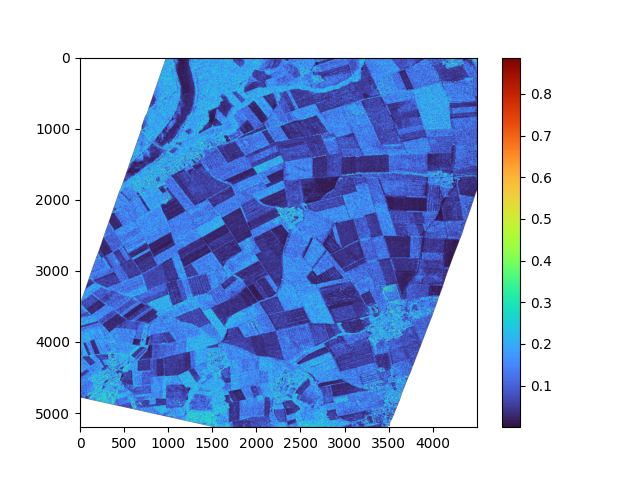

In [64]:
#visualise entropy
plt.figure()
plt.imshow(entropy, cmap='turbo', aspect='auto')
plt.colorbar()


## Anisotropy

Anistropty in the full-pol case indicates the presence of a second scattering mechanism. Howver in the dual-pol case, it is calaulted using only the two eigenvalues. (contreversia use of interpretation for indicating second scattering mechanism)

Formally, it is defined in the dual-pol case 

$$
A = \frac{\lambda_{1}-\lambda_{2}}{\lambda_{1}+\lambda_{2}}.
$$

In [65]:
anisotropy = (lambda1 - lambda2) / (lambda1 + lambda2)

/var/folders/g7/2783kfj16zj6nhq_m66yk50m0000gp/T/ipykernel_52706/2280627833.py:1: RuntimeWarning: invalid value encountered in divide
  anisotropy = (lambda1 - lambda2) / (lambda1 + lambda2)


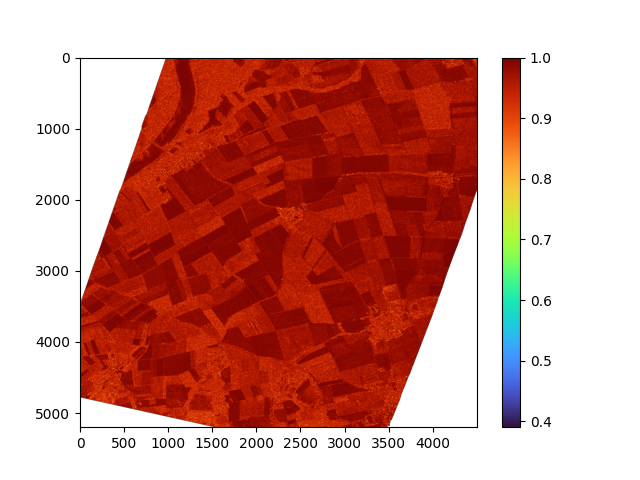

In [66]:
#visualise anisotropy
plt.figure()
plt.imshow(anisotropy, cmap='turbo', aspect='auto')
plt.colorbar()


## Mean alpha angles

The alpha angle describes the dominant scattering mechanism such that

$$
\alpha_{i} = cos^{-1}(|(v_i)|).
$$

- $\alpha_{i} = 0 ° $: surface scattering
- $\alpha_{i} = 45 ° $: volume scattering
- $\alpha_{i} = 90 ° $: dihedral scattering


In [67]:
alpha1 = np.arccos(np.abs(U1[:,:,0]))  # [rad]
alpha2 = np.arccos(np.abs(U2[:,:,0]))

In [68]:
# -- delete unused variables
del U1, U2

In [69]:
# -- compute the mean alpha angle
alpha_mean = pr1*alpha1 + pr2*alpha2 
# -- transfer to degrees
alpha_mean = np.degrees(alpha_mean)

## Plotting

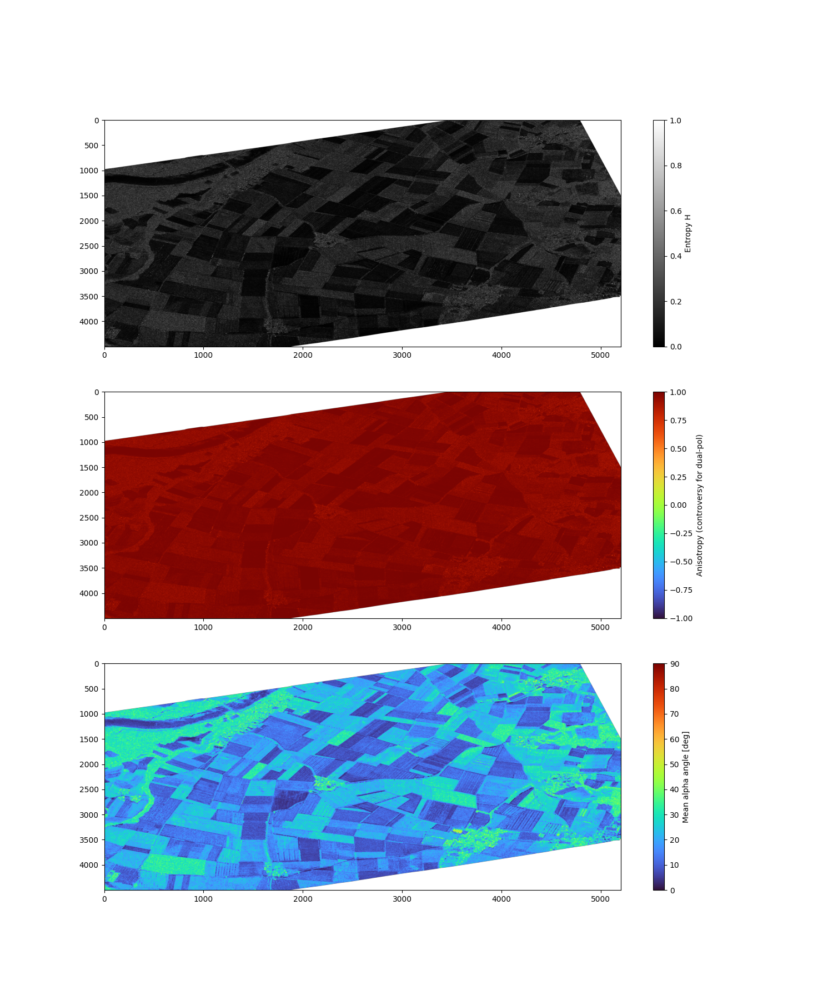

In [70]:
# Plot: H, alpha
plt.figure(figsize=(15, 6*3))

plt.subplot(3,1,1)
plt.imshow(np.transpose(entropy), cmap='gray', vmin=0, vmax=1, aspect='auto')
cb = plt.colorbar()
cb.set_label('Entropy H')

plt.subplot(3,1,2)
plt.imshow(np.transpose(anisotropy), cmap='turbo', vmin=-1, vmax=1, aspect='auto')
cb = plt.colorbar()
cb.set_label('Anisotropy (controversy for dual-pol)')

plt.subplot(3,1,3)
plt.imshow(np.transpose(alpha_mean), cmap='turbo', vmin=0, vmax=90, aspect='auto')
cb = plt.colorbar()
cb.set_label('Mean alpha angle [deg]')





In [71]:
# Hue: mean alpha angle
# normalize the mean alpha angle: it has to be between 0 and 1 --> divide by 90 degrees
hue = alpha_mean / 90

# Import the colormap for plotting alpha
colormap = plt.colormaps.get('turbo')

# Intensity: normalize the amplitude
amp = np.sqrt(abs(T11) + abs(T22) )
amp = np.clip(amp, 0, 2.5*np.mean(amp))
amp = amp / np.max(amp)

# Saturation
# Case 1)
sat1 = np.ones_like(amp)
# Case 2)
sat2 = 1 - entropy

# Generate the HSV colormaps

# Case 1
rgb_comp1 = HSV_colormap_to_rgb(colormap, hue, sat1, amp)

# Case 2
rgb_comp2 = HSV_colormap_to_rgb(colormap, hue, sat2, amp)

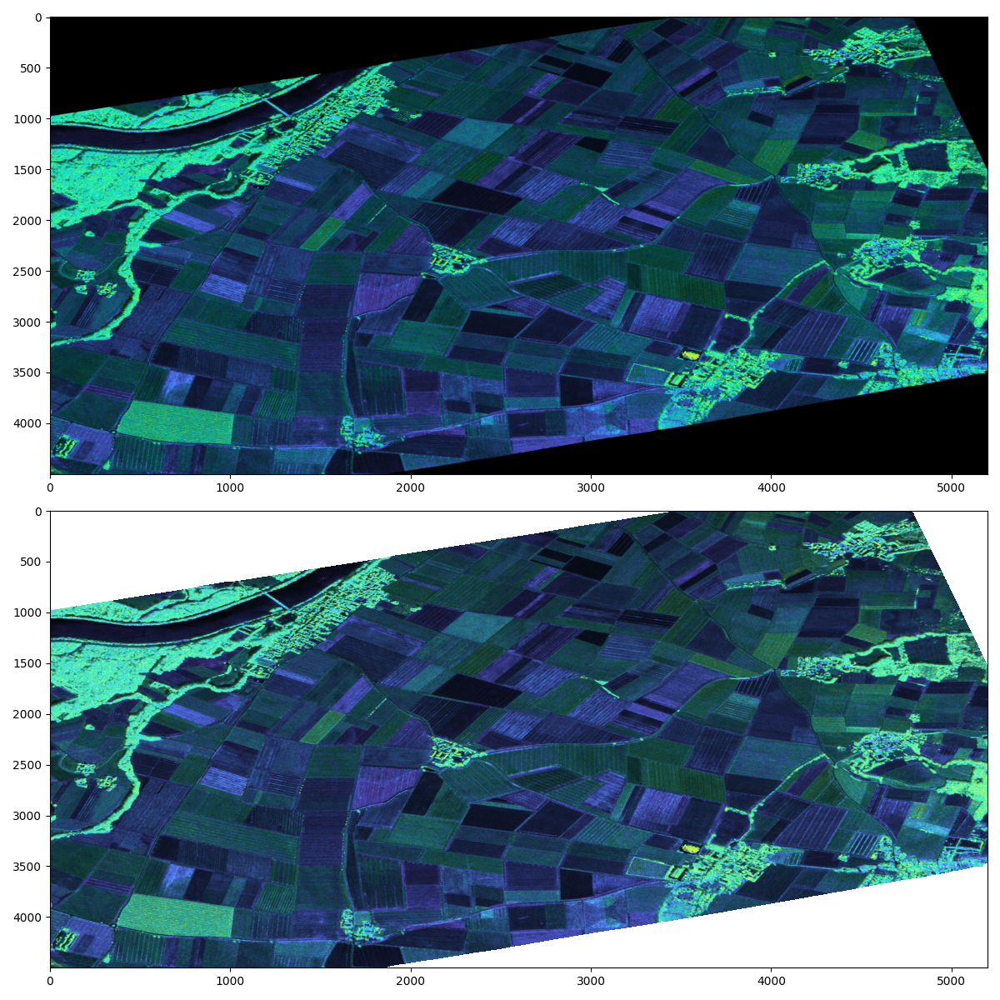

In [72]:
# Plot: HSI representations

plt.figure(figsize=(12,12))

plt.subplot(2,1,1)
plt.imshow(np.transpose(rgb_comp1, axes=(1,0,2)), aspect = 'auto')

plt.subplot(2,1,2)
plt.imshow(np.transpose(rgb_comp2, axes=(1,0,2)), aspect = 'auto')

plt.tight_layout()